# Обучение модели [YOLOv5](https://github.com/ultralytics/yolov5/) на датасете c мусором [TACO](http://tacodataset.org/)



### Структура проекта
* [Подключение необходимых библиотек](#libs)
* [Подготовка датасета](#dataset)
* [Обучение модели YOLOv5](#model)
* [Оценка модели на тестовой выборке](#test)
* [Вывод](#conclusion)

<a id="libs"></a>
## Подключение необходимых библиотек

In [1]:
import os
import shutil
import glob
import numpy as np
import pandas as pd
import tqdm
import splitfolders
from pycocotools.coco import COCO
from IPython.display import Image, display

In [2]:
v = !python --version
print('python version: {}'.format(v))
print('numpy version: {}'.format(np.__version__))
print('pandas version: {}'.format(pd.__version__))
print('tqdm version: {}'.format(tqdm.__version__))
print('splitfolders version: {}'.format(splitfolders.__version__))

python version: ['Python 3.9.7']
numpy version: 1.21.2
pandas version: 1.3.4
tqdm version: 4.62.3
splitfolders version: 0.5.1


#### Клонирование репозитория с актуальной версией YOLOv5

In [1]:
!git clone https://github.com/ultralytics/yolov5

fatal: destination path 'yolov5' already exists and is not an empty directory.


<a id="dataset"></a>
## Подготовка датасета

In [3]:
data_source = COCO(annotation_file='./data/annotations.json')

loading annotations into memory...
Done (t=0.05s)
creating index...
index created!


In [4]:
data_source.info()

year: 2019
version: None
description: TACO
contributor: None
url: None
date_created: 2019-12-19T16:11:15.258399+00:00


In [5]:
# remapping label id to 0~1
label_transfer = {5: 0, 12: 1}

img_ids = data_source.getImgIds()

catIds = data_source.getCatIds()
categories = data_source.loadCats(catIds)
categories.sort(key=lambda x: x['id'])
classes = {}
coco_labels = {}
coco_labels_inverse = {}
for c in categories:
    coco_labels[len(classes)] = c['id']
    coco_labels_inverse[c['id']] = len(classes)
    classes[c['name']] = len(classes)

class_num = {}

In [6]:
categories

[{'supercategory': 'Aluminium foil', 'id': 0, 'name': 'Aluminium foil'},
 {'supercategory': 'Battery', 'id': 1, 'name': 'Battery'},
 {'supercategory': 'Blister pack', 'id': 2, 'name': 'Aluminium blister pack'},
 {'supercategory': 'Blister pack', 'id': 3, 'name': 'Carded blister pack'},
 {'supercategory': 'Bottle', 'id': 4, 'name': 'Other plastic bottle'},
 {'supercategory': 'Bottle', 'id': 5, 'name': 'Clear plastic bottle'},
 {'supercategory': 'Bottle', 'id': 6, 'name': 'Glass bottle'},
 {'supercategory': 'Bottle cap', 'id': 7, 'name': 'Plastic bottle cap'},
 {'supercategory': 'Bottle cap', 'id': 8, 'name': 'Metal bottle cap'},
 {'supercategory': 'Broken glass', 'id': 9, 'name': 'Broken glass'},
 {'supercategory': 'Can', 'id': 10, 'name': 'Food Can'},
 {'supercategory': 'Can', 'id': 11, 'name': 'Aerosol'},
 {'supercategory': 'Can', 'id': 12, 'name': 'Drink can'},
 {'supercategory': 'Carton', 'id': 13, 'name': 'Toilet tube'},
 {'supercategory': 'Carton', 'id': 14, 'name': 'Other carton'

#### Подготовка аннотаций

In [3]:
%cd yolov5

/home/sergzemsk/dls/yolov5


In [7]:
!mkdir -p tmp/labels tmp/images
save_base_path  = 'tmp/labels/'
save_image_path = 'tmp/images/'

/home/sergzemsk/dls/yolov5


In [8]:
for index, img_id in tqdm.tqdm(enumerate(img_ids), desc='change .json file to .txt file'):
    img_info = data_source.loadImgs(img_id)[0]
    save_name = img_info['file_name'].replace('/', '_')
    file_name = save_name.split('.')[0]
    height = img_info['height']
    width = img_info['width']
    save_path = save_base_path + file_name + '.txt'
    is_exist = False
    with open(save_path, mode='w') as fp:
        annotation_id = data_source.getAnnIds(img_id)
        boxes = np.zeros((0, 5))
        if len(annotation_id) == 0:
            fp.write('')
            continue
        annotations = data_source.loadAnns(annotation_id)
        lines = ''
        for annotation in annotations:
            label = coco_labels_inverse[annotation['category_id']]
            if label in label_transfer.keys():
                is_exist = True
                box = annotation['bbox']
                if box[2] < 1 or box[3] < 1:
                    continue
                # top_x,top_y,width,height==>cen_x,cen_y,width,height
                box[0] = round((box[0] + box[2] / 2) / width, 6)
                box[1] = round((box[1] + box[3] / 2) / height, 6)
                box[2] = round(box[2] / width, 6)
                box[3] = round(box[3] / height, 6)
                label = label_transfer[label]
                if label not in class_num.keys():
                    class_num[label] = 0
                class_num[label] += 1
                lines = lines + str(label)
                for i in box:
                    lines += ' ' + str(i)
                lines += '\n'
        fp.writelines(lines)
    if is_exist:
        shutil.copy('../data/{}'.format(img_info['file_name']), os.path.join(save_image_path, save_name))
    else:
        os.remove(save_path)

change .json file to .txt file: 1500it [00:01, 1291.67it/s]


<a id="model"></a>
## Обучение модели YOLOv5

#### Деление на тренировочную, валидационную и тестовую выборки

In [9]:
splitfolders.ratio('tmp', output="taco", seed=3407, ratio=(.82, 0.17, 0.01)) 

Copying files: 708 files [00:01, 613.81 files/s] 


Датасет для тестирования модели

In [10]:
!ls taco/test/images

batch_10_000035.jpg  batch_13_000042.jpg   batch_5_000052.JPG
batch_10_000075.jpg  batch_13_000088.jpg   batch_5_000070.JPG
batch_1_000014.jpg   batch_14_000048.jpg   batch_5_000103.JPG
batch_1_000024.jpg   batch_15_000062.jpg   batch_6_000066.JPG
batch_1_000025.jpg   batch_2_000018.JPG    batch_7_000010.JPG
batch_1_000048.jpg   batch_2_000027.JPG    batch_7_000091.JPG
batch_1_000062.JPG   batch_2_000048.JPG    batch_7_000109.JPG
batch_1_000110.JPG   batch_2_000049.JPG    batch_7_000118.JPG
batch_11_000048.jpg  batch_2_000088.JPG    batch_8_000011.jpg
batch_12_000012.jpg  batch_3_IMG_4932.JPG  batch_8_000013.jpg
batch_13_000027.jpg  batch_3_IMG_4941.JPG  batch_8_000077.jpg
batch_13_000036.jpg  batch_3_IMG_5053.JPG  batch_8_000087.jpg


#### Обучение модели YOLOv5

In [11]:
!nvidia-smi

Sun Feb 13 09:13:23 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.39       Driver Version: 460.39       CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  A100-SXM-80GB       Off  | 00000000:8B:00.0 Off |                    0 |
| N/A   29C    P0    50W / 500W |      4MiB / 81251MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [12]:
CONFIG_FILE = '../taco2.yaml'
IMG_SIZE = 640
BATCH_SIZE = 320
EPOCHS = 5000
CFG = 'models/yolov5s.yaml'
WEIGHTS = 'yolov5s'

In [13]:
!python train.py --img {IMG_SIZE} --batch {BATCH_SIZE} --epochs {EPOCHS} --data {CONFIG_FILE} --cfg {CFG} --weights {WEIGHTS} --patience 500 --cache

train: weights=yolov5s, cfg=models/yolov5s.yaml, data=../taco2.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=5000, batch_size=320, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=500, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
Command 'git fetch && git config --get remote.origin.url' timed out after 5 seconds
YOLOv5 🚀 v6.0-253-ga45e472 torch 1.10.1 CUDA:0 (A100-SXM-80GB, 81251MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, 


     Epoch   gpu_mem       box       obj       cls    labels  img_size
   32/4999       65G   0.09631   0.02472   0.02619       704       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133   0.000176       0.06   0.000104   2.63e-05

     Epoch   gpu_mem       box       obj       cls    labels  img_size
   33/4999       65G   0.09631   0.02333   0.02626       666       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133   0.000157     0.0533   0.000138   2.62e-05

     Epoch   gpu_mem       box       obj       cls    labels  img_size
   34/4999       65G   0.09615   0.02501   0.02626       714       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133   0.000157     0.0533   8.99e-05   2.39e-05

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
   83/4999       65G   0.09407   0.02788   0.02569       792       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133   0.000176       0.06   0.000103   2.12e-05

     Epoch   gpu_mem       box       obj       cls    labels  img_size
   84/4999       65G   0.09462   0.02509   0.02562       710       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133   0.000157     0.0533   9.04e-05   1.42e-05

     Epoch   gpu_mem       box       obj       cls    labels  img_size
   85/4999       65G   0.09462   0.02673   0.02633       764       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133   0.000176       0.06   0.000119      2e-05

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  134/4999       65G   0.09285   0.02507   0.02571       748       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133    0.00293      0.133    0.00188   0.000349

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  135/4999       65G   0.08738   0.02808   0.02496       747       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133    0.00912      0.022    0.00205   0.000381

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  136/4999       65G   0.08656   0.02766   0.02516       763       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133     0.0154     0.0153    0.00252   0.000498

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  185/4999       65G   0.08585   0.02263   0.02196       674       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133     0.0625     0.0851      0.023    0.00639

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  186/4999       65G   0.07874   0.02478   0.02191       717       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133     0.0428       0.16     0.0239    0.00498

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  187/4999       65G   0.07792   0.02541   0.02309       758       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.083       0.11      0.038     0.0084

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  236/4999       65G   0.07453   0.02374   0.01755       750       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133     0.0999        0.2     0.0356    0.00629

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  237/4999       65G     0.074   0.02281   0.01807       723       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133     0.0407      0.203     0.0233    0.00723

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  238/4999       65G   0.07477   0.02183   0.01803       690       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133     0.0557     0.0906      0.017     0.0028

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  287/4999       65G    0.0688   0.02461   0.01579       772       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133     0.0222     0.0478    0.00652    0.00134

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  288/4999       65G   0.07439   0.02178   0.01783       746       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133    0.00453     0.0945    0.00209    0.00041

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  289/4999       65G   0.07869   0.02164   0.02805       704       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133    0.00523     0.0325    0.00159   0.000385

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  338/4999       65G   0.06594   0.01969  0.008627       686       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.208      0.169     0.0817     0.0336

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  339/4999       65G   0.06193    0.0205   0.00739       720       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.203      0.169     0.0927     0.0239

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  340/4999       65G   0.07135   0.01972  0.007825       702       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.221      0.128     0.0645     0.0197

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  389/4999       65G    0.0649   0.02069  0.005692       722       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.264      0.218      0.128     0.0394

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  390/4999       65G      0.06   0.02026  0.005609       755       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.268      0.239       0.13     0.0441

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  391/4999       65G   0.06435   0.01987  0.005515       797       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.205      0.226      0.107     0.0244

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  440/4999       65G   0.06778   0.01591  0.003928       697       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.241       0.25      0.139     0.0467

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  441/4999       65G   0.05734   0.01778  0.003498       695       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.202      0.303      0.132     0.0412

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  442/4999       65G   0.06094   0.01684  0.003461       737       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.238      0.223      0.113     0.0432

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  491/4999       65G   0.05703   0.01693  0.003453       734       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.283      0.363      0.213     0.0782

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  492/4999       65G   0.05851   0.01604  0.003063       719       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.311      0.187      0.163     0.0624

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  493/4999       65G   0.05476   0.01625  0.003597       696       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.438       0.18       0.16     0.0597

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  542/4999       65G   0.05724   0.01688  0.003646       775       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.244      0.243      0.145     0.0624

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  543/4999       65G    0.0492    0.0166  0.003257       718       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.556      0.209      0.251     0.0807

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  544/4999       65G   0.05646   0.01584   0.00238       771       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.454      0.367       0.29      0.123

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  593/4999       65G   0.04801   0.01358  0.002184       665       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.451      0.368      0.329      0.151

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  594/4999       65G   0.05112    0.0143  0.001748       720       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133       0.45      0.254      0.257     0.0913

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  595/4999       65G   0.05186   0.01337  0.001983       665       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133       0.48      0.358      0.315      0.128

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  644/4999       65G   0.04847   0.01381  0.002329       720       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.411      0.315      0.236     0.0956

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  645/4999       65G   0.04806   0.01402  0.002761       734       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.504      0.305        0.3      0.135

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  646/4999       65G   0.04882   0.01411  0.002989       741       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.412       0.39       0.34      0.137

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  695/4999       65G   0.05577   0.01262  0.002327       716       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.534      0.338      0.343      0.175

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  696/4999       65G   0.04221   0.01316  0.001907       727       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.602      0.333       0.34      0.156

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  697/4999       65G   0.04332   0.01293  0.001976       711       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.612      0.335       0.36      0.177

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  746/4999       65G   0.03977   0.01355  0.001834       756       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.519      0.329      0.314      0.145

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  747/4999       65G   0.04511   0.01225  0.001948       680       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.609      0.327      0.329      0.186

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  748/4999       65G   0.04345   0.01322  0.001771       748       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.535      0.408      0.371      0.199

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  797/4999       65G   0.04247    0.0133  0.002199       765       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.621      0.332      0.351      0.187

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  798/4999       65G   0.04406   0.01282  0.002155       710       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.508      0.384      0.369      0.195

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  799/4999       65G    0.0406   0.01212  0.001642       714       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.637      0.355      0.388      0.191

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  848/4999       65G   0.04098   0.01233  0.001438       744       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.571      0.358      0.407      0.215

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  849/4999       65G   0.04544   0.01078  0.001402       646       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.561      0.349      0.385      0.199

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  850/4999       65G   0.04091   0.01375  0.001645       729       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.452      0.346      0.306      0.175

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  899/4999       65G   0.03289   0.01117  0.001898       710       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.681      0.368      0.443      0.278

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  900/4999       65G   0.03375   0.01082  0.002107       713       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.504      0.449      0.435      0.252

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  901/4999       65G   0.04101   0.01129  0.002473       759       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.575      0.363      0.408      0.252

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
  950/4999       65G   0.03421   0.01095   0.00141       674       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.722      0.408      0.449      0.299

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  951/4999       65G   0.03138   0.01047  0.001497       665       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.758      0.392      0.449      0.302

     Epoch   gpu_mem       box       obj       cls    labels  img_size
  952/4999       65G   0.03512   0.01094  0.001393       742       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.652      0.438      0.418      0.247

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1001/4999       65G   0.03579   0.01033  0.001546       672       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.713        0.4       0.46      0.315

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1002/4999       65G    0.0311   0.01018  0.001894       713       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.819      0.392      0.469      0.317

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1003/4999       65G   0.02981    0.0102  0.002024       702       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.673      0.434       0.45      0.315

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1052/4999       65G   0.03063   0.01062  0.001357       690       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.705      0.432      0.459      0.271

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1053/4999       65G   0.03259  0.009874  0.001118       712       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.552      0.456      0.441      0.283

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1054/4999       65G   0.03227   0.01059   0.00153       722       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.689      0.383        0.4      0.238

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1103/4999       65G   0.02787  0.009821  0.001062       724       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.796      0.384      0.451      0.314

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1104/4999       65G   0.03038  0.009813 0.0009084       750       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.749       0.36      0.436       0.29

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1105/4999       65G   0.03294  0.009926  0.001168       763       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.773      0.377      0.444      0.304

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1154/4999       65G   0.02761  0.008871  0.001537       667       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.682      0.477      0.501      0.333

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1155/4999       65G   0.02629  0.009112  0.001274       771       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.648      0.491      0.509      0.355

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1156/4999       65G   0.02748   0.00929  0.001427       685       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133        0.7      0.474      0.502      0.337

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1205/4999       65G   0.02811  0.009348 0.0008073       718       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.754      0.416       0.48      0.332

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1206/4999       65G   0.02823  0.009537 0.0009175       705       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.607      0.487      0.486      0.354

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1207/4999       65G   0.02767  0.009186 0.0008076       725       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.634       0.46       0.49      0.346

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1256/4999       65G   0.02668  0.008456 0.0009429       683       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.722      0.424      0.486      0.338

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1257/4999       65G   0.02774  0.009303 0.0006477       751       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.658      0.446      0.486      0.343

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1258/4999       65G   0.02792  0.009519 0.0007858       752       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.717       0.41       0.48      0.329

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1307/4999       65G   0.02375  0.008486 0.0009602       721       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.674      0.463      0.497      0.348

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1308/4999       65G    0.0272  0.009252 0.0008957       768       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.679      0.463      0.487       0.35

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1309/4999       65G   0.02702  0.008659 0.0008611       734       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.691       0.46       0.49      0.349

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1358/4999       65G   0.02483  0.008246 0.0006046       700       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.668      0.478      0.493      0.352

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1359/4999       65G   0.02376  0.008723 0.0005496       739       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.656      0.484      0.494      0.337

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1360/4999       65G   0.02459   0.00909 0.0007515       767       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.645      0.455      0.477      0.342

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1409/4999       65G   0.02489  0.008328  0.001052       717       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.759      0.416      0.489      0.354

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1410/4999       65G   0.02455  0.008075   0.00104       690       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.758      0.432      0.503      0.358

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1411/4999       65G   0.02509  0.008425  0.001286       723       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.735      0.446      0.498      0.352

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1460/4999       65G   0.02385  0.008741 0.0007946       749       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.854      0.402      0.483      0.353

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1461/4999       65G   0.02669  0.008485  0.001053       687       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133       0.77      0.395      0.464      0.353

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1462/4999       65G   0.02289  0.008135 0.0009113       692       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.842      0.387      0.478      0.362

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1511/4999       65G   0.02536   0.00822  0.001042       717       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.665      0.456      0.489      0.367

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1512/4999       65G   0.02737  0.008022 0.0007509       700       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.716      0.436      0.499      0.384

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1513/4999       65G   0.02377  0.007887 0.0007314       722       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.691      0.467      0.514      0.388

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1562/4999       65G   0.02303  0.007285  0.000617       649       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133       0.66      0.501      0.524      0.395

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1563/4999       65G    0.0233  0.008345 0.0006488       735       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.713      0.457      0.514       0.38

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1564/4999       65G   0.02437  0.007981 0.0008534       746       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.742      0.456      0.513      0.378

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1613/4999       65G   0.02367  0.007618 0.0006279       706       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.691      0.485      0.525      0.403

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1614/4999       65G   0.02458  0.007667 0.0006318       718       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.692      0.484      0.523      0.402

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1615/4999       65G   0.02234  0.007796 0.0007215       714       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.753      0.456      0.529      0.403

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1664/4999       65G   0.02389  0.007865 0.0009397       738       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.852      0.425      0.498      0.378

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1665/4999       65G   0.02227   0.00722 0.0009547       691       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.717      0.472      0.501      0.382

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1666/4999       65G   0.02281  0.007593 0.0009271       718       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.694      0.486      0.503      0.381

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1715/4999       65G   0.02267  0.007451 0.0008967       714       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.589      0.509      0.505      0.378

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1716/4999       65G   0.02328  0.007557 0.0008041       720       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.743      0.419      0.493      0.366

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1717/4999       65G   0.02294  0.008378  0.001119       767       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.746      0.419      0.489      0.361

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1766/4999       65G   0.02188  0.007623 0.0005951       767       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.736      0.541      0.561      0.413

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1767/4999       65G   0.02607  0.007935 0.0006724       748       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.761        0.5      0.554      0.409

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1768/4999       65G     0.022  0.007304 0.0005012       710       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.704      0.539      0.562      0.391

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1817/4999       65G   0.01963    0.0072 0.0008942       715       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.663      0.502      0.519      0.393

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1818/4999       65G   0.02278  0.007463 0.0006233       744       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.787      0.465      0.524      0.392

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1819/4999       65G   0.01987  0.006788 0.0006428       679       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.804      0.465      0.518       0.39

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1868/4999       65G   0.02068  0.007196 0.0005855       702       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.748      0.432      0.508      0.389

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1869/4999       65G   0.02025  0.006819 0.0005226       664       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133       0.89      0.399      0.512      0.402

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1870/4999       65G   0.02274  0.007584 0.0005111       762       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.667      0.471      0.514      0.388

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1919/4999       65G   0.02121  0.006935 0.0007893       719       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.781      0.415      0.503      0.379

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1920/4999       65G   0.02045  0.006804 0.0005929       678       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.688      0.452      0.505      0.388

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1921/4999       65G   0.02013  0.006526 0.0004872       659       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.789      0.424      0.507      0.386

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1970/4999       65G   0.01955  0.007054 0.0005646       703       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.773      0.493      0.531      0.406

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1971/4999       65G   0.01861  0.006595 0.0006721       707       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.734      0.507      0.532      0.415

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1972/4999       65G   0.02012  0.006867 0.0006726       754       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.788       0.48      0.529      0.414

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2021/4999       65G   0.02093  0.007033 0.0004474       736       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133       0.73      0.462      0.524      0.411

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2022/4999       65G      0.02  0.006336  0.001214       652       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.825       0.43      0.524      0.417

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2023/4999       65G   0.02153   0.00734 0.0005006       742       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.789      0.436      0.528      0.416

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2072/4999       65G   0.02029  0.006931 0.0005871       731       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.824      0.404      0.498      0.381

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2073/4999       65G   0.02012  0.007078 0.0005143       735       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.804      0.404      0.504      0.381

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2074/4999       65G    0.0184  0.006644 0.0004748       714       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.682      0.456       0.51      0.388

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2123/4999       65G   0.01898  0.007175 0.0007159       766       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.773      0.477      0.531      0.411

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2124/4999       65G   0.01855  0.006501 0.0005786       702       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.761      0.471      0.527      0.406

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2125/4999       65G   0.01897  0.006953 0.0006932       743       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.793      0.471      0.536      0.408

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2174/4999       65G   0.01761  0.006957 0.0004931       734       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.789      0.463       0.53       0.42

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2175/4999       65G   0.01777  0.006827  0.000377       779       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.766       0.47      0.531      0.425

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2176/4999       65G   0.01705  0.006109 0.0003926       676       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.701      0.497      0.522      0.413

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2225/4999       65G   0.01841  0.006618 0.0005064       741       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.647      0.502      0.515      0.396

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2226/4999       65G    0.0197  0.006391 0.0004082       689       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.787      0.452      0.518      0.397

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2227/4999       65G   0.01829  0.007043 0.0006412       762       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.794      0.443      0.517      0.392

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2276/4999       65G   0.01909  0.006446 0.0004652       721       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.639      0.556      0.538      0.405

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2277/4999       65G   0.01842  0.006645 0.0003235       725       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.677      0.553      0.545      0.398

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2278/4999       65G    0.0176  0.006503  0.000327       755       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133       0.65      0.555      0.539      0.402

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2327/4999       65G   0.01749  0.006575  0.000458       754       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133       0.74      0.458      0.514        0.4

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2328/4999       65G   0.01919  0.006862 0.0006386       739       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.717       0.48      0.525      0.413

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2329/4999       65G   0.01692  0.006255  0.000468       727       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.805      0.445      0.524      0.409

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2378/4999       65G   0.01786  0.006365 0.0006891       730       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.833      0.449      0.516      0.416

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2379/4999       65G   0.01753   0.00651 0.0006173       761       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.853      0.449      0.517      0.415

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2380/4999       65G   0.01673  0.005883 0.0004697       682       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.854      0.431      0.513      0.414

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2429/4999       65G   0.01949  0.006185 0.0006268       697       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.649      0.501      0.535      0.421

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2430/4999       65G   0.01882  0.006487 0.0003993       718       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.735       0.45      0.532      0.419

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2431/4999       65G   0.01848  0.006769 0.0004097       722       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133       0.65       0.49      0.532      0.416

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2480/4999       65G   0.01655  0.006033 0.0004242       733       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.715      0.443      0.515      0.422

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2481/4999       65G    0.0168  0.005921 0.0004348       714       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.856      0.401      0.515      0.423

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2482/4999       65G   0.01682  0.005922 0.0009044       726       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.643      0.489      0.517      0.427

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2531/4999       65G   0.01632  0.006534 0.0005181       753       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.654      0.506      0.527      0.421

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2532/4999       65G   0.01783  0.006461 0.0007466       755       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.736      0.484      0.527       0.42

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2533/4999       65G    0.0173  0.006715  0.000586       785       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.738      0.477       0.53      0.422

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2582/4999       65G   0.01628  0.006297 0.0004616       718       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.855      0.424      0.527      0.427

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2583/4999       65G   0.01838  0.006129 0.0003591       692       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.871       0.42      0.518      0.425

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2584/4999       65G   0.01713  0.006574 0.0003618       776       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.839      0.424      0.519      0.424

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2633/4999       65G   0.01642  0.006201 0.0003679       754       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.695      0.489      0.526      0.418

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2634/4999       65G   0.01715  0.005985 0.0002903       678       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.723      0.485      0.529      0.418

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2635/4999       65G   0.01621  0.005868  0.000384       738       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.711      0.481      0.526      0.421

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2684/4999       65G   0.01769  0.006126 0.0004357       769       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.722      0.556      0.561      0.447

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2685/4999       65G   0.01625   0.00607 0.0004026       754       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.736      0.553      0.565      0.445

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2686/4999       65G   0.01482   0.00564 0.0003068       706       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.738      0.558      0.569      0.449

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2735/4999       65G   0.01528  0.005674 0.0003928       733       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.725      0.499      0.527      0.423

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2736/4999       65G   0.01489  0.005405 0.0004244       678       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.759      0.499      0.538      0.426

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2737/4999       65G   0.01735  0.006631 0.0003925       808       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.767      0.499      0.546      0.435

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2786/4999       65G   0.01595  0.005883 0.0004746       758       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.713      0.513      0.535      0.423

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2787/4999       65G   0.01487  0.005342 0.0005854       674       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.768       0.48      0.527      0.426

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2788/4999       65G   0.01514  0.005438 0.0007802       696       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.801      0.489      0.537       0.43

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2837/4999       65G   0.01669  0.006044 0.0005989       719       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.853      0.456       0.53       0.43

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2838/4999       65G   0.01482  0.005743 0.0004248       746       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.851      0.448      0.531      0.425

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2839/4999       65G     0.015  0.005617 0.0006647       725       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133       0.83      0.452      0.533      0.433

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2888/4999       65G   0.01456  0.005846 0.0007606       742       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.703      0.465      0.527      0.428

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2889/4999       65G   0.01427  0.005124 0.0003235       701       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.782      0.443      0.523      0.424

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2890/4999       65G    0.0158  0.005793 0.0002865       757       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.737      0.465      0.521      0.425

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2939/4999       65G   0.01645  0.005872 0.0004177       746       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.798      0.468      0.546       0.44

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2940/4999       65G   0.01461  0.005433 0.0003357       726       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.761      0.474      0.548       0.44

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2941/4999       65G    0.0152  0.005572  0.000363       691       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.735      0.497      0.551       0.44

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2990/4999       65G   0.01427   0.00543 0.0003484       735       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.858      0.454       0.55      0.441

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2991/4999       65G   0.01482   0.00497 0.0004058       661       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133       0.82      0.469      0.549      0.439

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2992/4999       65G   0.01388  0.005279 0.0003179       686       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.839       0.46       0.55      0.441

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3041/4999       65G   0.01339  0.005098 0.0003705       695       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.665      0.543      0.564      0.455

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3042/4999       65G    0.0147  0.005005 0.0002794       670       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.667      0.542      0.565      0.453

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3043/4999       65G   0.01483  0.005211 0.0002452       713       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.684      0.543      0.563      0.454

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3092/4999       65G   0.01429  0.005088 0.0006224       708       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.818      0.475      0.567       0.45

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3093/4999       65G    0.0147  0.005666  0.000338       799       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.787      0.475      0.566      0.452

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3094/4999       65G   0.01476  0.005537 0.0003426       758       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.787      0.475      0.562      0.446

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3143/4999       65G     0.014  0.005136  0.000996       699       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133       0.76      0.481      0.555      0.454

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3144/4999       65G   0.01288  0.005047  0.000572       695       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133       0.76      0.484       0.55      0.451

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3145/4999       65G   0.01346   0.00499  0.000451       699       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.778      0.477       0.55      0.454

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3194/4999       65G   0.01249   0.00509 0.0004354       713       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.792      0.462      0.548      0.444

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3195/4999       65G   0.01293  0.004893 0.0005837       718       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.761      0.484      0.555      0.441

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3196/4999       65G   0.01187  0.004599 0.0005739       657       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.736      0.493       0.55      0.447

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3245/4999       65G   0.01354  0.005152 0.0002419       738       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.685      0.515      0.558      0.449

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3246/4999       65G   0.01227  0.004672 0.0002797       670       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.704      0.497      0.554      0.448

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3247/4999       65G   0.01241  0.004797 0.0002651       698       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.699      0.497      0.548      0.445

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3296/4999       65G   0.01369  0.004809 0.0005201       719       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133       0.67      0.508      0.552      0.458

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3297/4999       65G   0.01226  0.004719  0.000343       679       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.678      0.524      0.557       0.46

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3298/4999       65G   0.01195  0.005115 0.0003482       733       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133       0.69      0.518      0.561      0.465

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3347/4999       65G   0.01489  0.005012 0.0003178       714       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.649       0.54      0.558      0.456

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3348/4999       65G   0.01261  0.005152 0.0003163       731       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.648      0.541      0.556      0.458

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3349/4999       65G   0.01311  0.005048 0.0003174       771       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.674      0.524      0.556      0.454

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3398/4999       65G   0.01282  0.004828 0.0002996       717       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.786      0.464      0.544      0.454

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3399/4999       65G   0.01195  0.004657 0.0002784       702       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.824      0.456      0.543      0.455

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3400/4999       65G   0.01171  0.004647 0.0003249       749       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.801      0.468      0.542      0.453

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3449/4999       65G   0.01234  0.004943 0.0002867       736       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.782      0.467      0.543      0.453

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3450/4999       65G   0.01142  0.004928 0.0003385       748       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.752       0.48      0.539      0.452

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3451/4999       65G   0.01215  0.004671 0.0002391       698       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.836       0.46      0.537      0.449

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3500/4999       65G   0.01246  0.004473 0.0004146       693       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.641      0.518      0.539      0.454

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3501/4999       65G   0.01265  0.005138 0.0004461       773       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.686      0.502      0.538      0.454

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3502/4999       65G   0.01174  0.004368 0.0002371       643       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.669      0.509      0.539      0.455

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3551/4999       65G   0.01122  0.004457 0.0002483       686       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.744      0.491      0.554      0.464

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3552/4999       65G   0.01107   0.00424 0.0003215       689       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.657      0.533      0.556      0.466

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3553/4999       65G   0.01157  0.004927 0.0002989       750       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.649       0.54      0.559      0.462

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3602/4999       65G   0.01188  0.004778 0.0004647       757       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.709      0.508      0.566      0.458

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3603/4999       65G   0.01115  0.004477 0.0003122       701       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.743      0.506      0.567      0.457

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3604/4999       65G   0.01158  0.004708  0.000374       713       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133       0.76      0.497      0.567      0.457

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3653/4999       65G   0.01123   0.00459 0.0002503       752       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.673      0.494      0.515      0.433

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3654/4999       65G   0.01071  0.004452 0.0002587       694       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.651      0.502      0.517      0.432

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3655/4999       65G   0.01084  0.004737  0.000315       703       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.676        0.5      0.517      0.435

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3704/4999       65G   0.01165  0.004591 0.0002983       713       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.679       0.52      0.549      0.448

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3705/4999       65G    0.0114  0.004509 0.0003168       718       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.732      0.501      0.549       0.45

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3706/4999       65G   0.01152  0.004371 0.0004014       686       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.713      0.501      0.548      0.451

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3755/4999       65G   0.01055  0.004497 0.0002973       714       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.758      0.448      0.521       0.44

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3756/4999       65G   0.01088  0.004377 0.0003572       713       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.773      0.438      0.517      0.437

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3757/4999       65G   0.01033  0.004364  0.000256       720       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.684      0.463      0.513      0.432

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3806/4999       65G   0.01059  0.004364  0.000228       720       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.808      0.495      0.554      0.459

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3807/4999       65G   0.01068  0.004388 0.0002333       722       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.827      0.478      0.554      0.458

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3808/4999       65G   0.01132  0.004708 0.0002455       746       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.821      0.476      0.554      0.457

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3857/4999       65G   0.01167   0.00442  0.000252       751       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133       0.68      0.477      0.537       0.45

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3858/4999       65G  0.009906  0.004067 0.0001845       683       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.644      0.488      0.538      0.452

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3859/4999       65G   0.01014  0.004176 0.0002336       675       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.692      0.474      0.538      0.451

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3908/4999       65G   0.01126  0.004536 0.0003468       759       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.679      0.513      0.526      0.443

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3909/4999       65G   0.01097  0.004553 0.0002228       737       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.724      0.496      0.525      0.441

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3910/4999       65G   0.01051  0.004473 0.0003507       752       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133       0.73      0.503      0.526      0.445

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3959/4999       65G   0.01028  0.004523 0.0002233       745       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.744      0.492      0.539      0.444

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3960/4999       65G   0.01017  0.004422 0.0002995       740       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.803      0.471      0.539      0.451

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 3961/4999       65G  0.009768   0.00447 0.0002624       749       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.813      0.471      0.538       0.45

     Epoch   gpu_mem       box      


     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4010/4999       65G  0.009369  0.003956 0.0001574       699       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133       0.69      0.519       0.54      0.457

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4011/4999       65G  0.009415  0.004137 0.0002263       735       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133       0.69      0.519       0.54      0.456

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 4012/4999       65G  0.009837   0.00406 0.0001734       712       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         85        133      0.691      0.519      0.542      0.457

     Epoch   gpu_mem       box      

#### Пример детекции объектов на тренировочной выборке

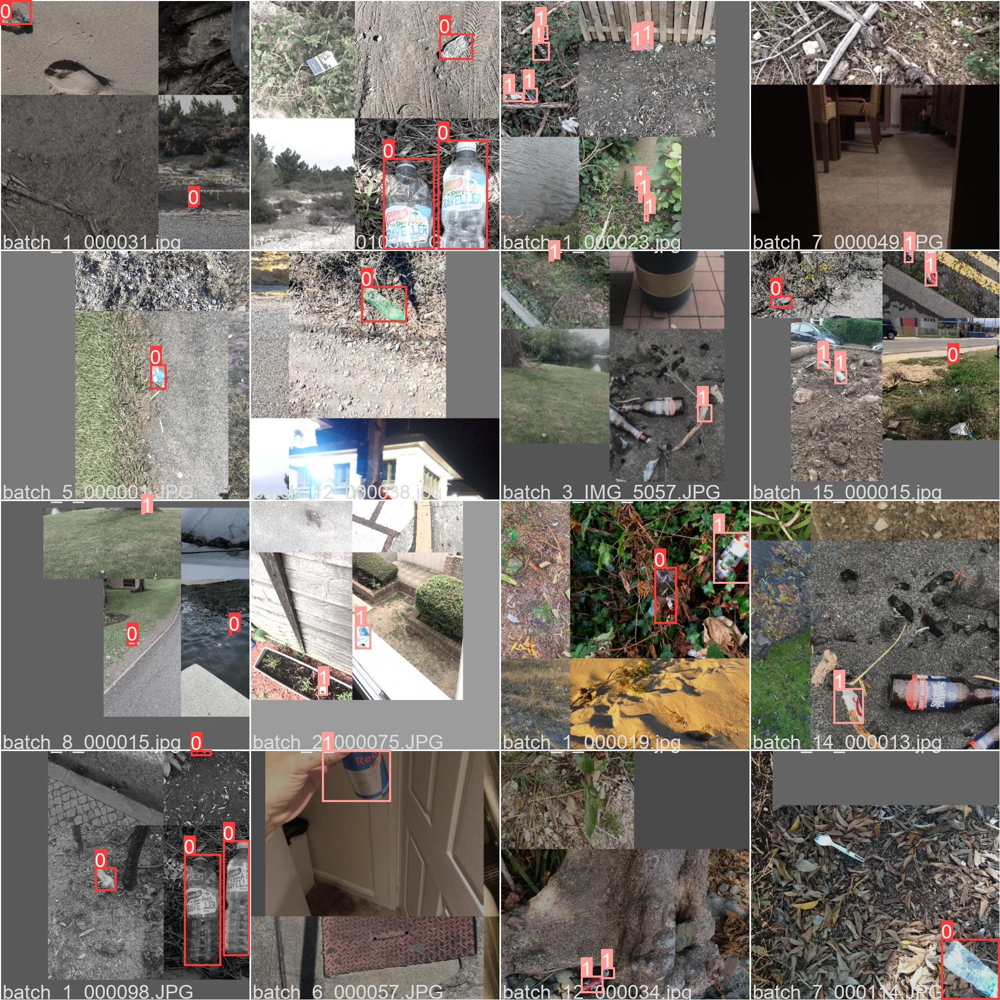

In [5]:
display(Image(filename='runs/train/exp/train_batch0.jpg', width=768))

#### Результаты обучения модели

Precision

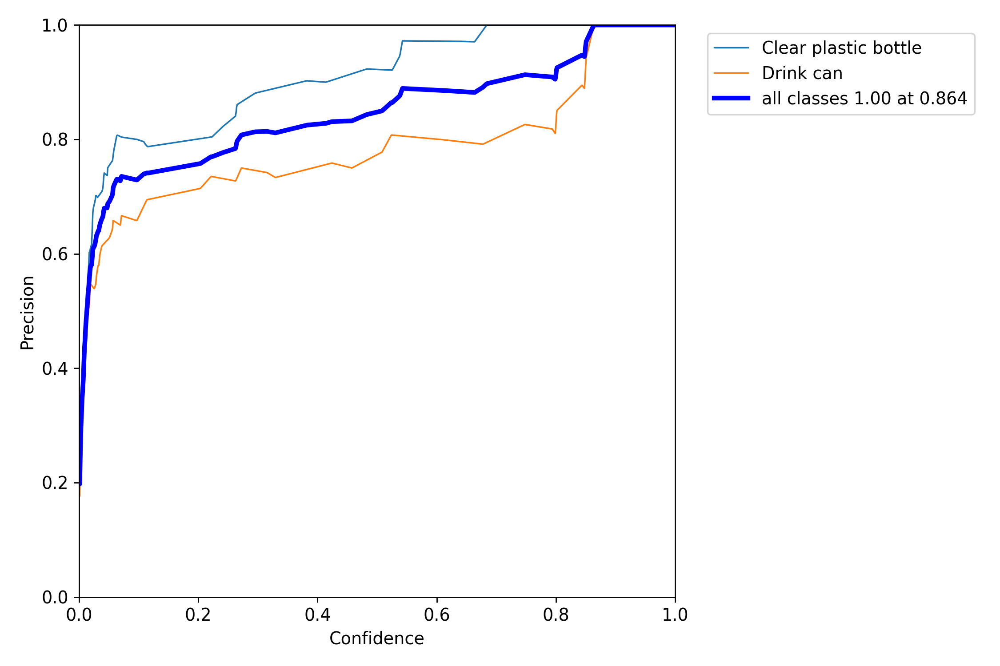

In [33]:
display(Image(filename='runs/train/exp/P_curve.png', width=640))

Recall

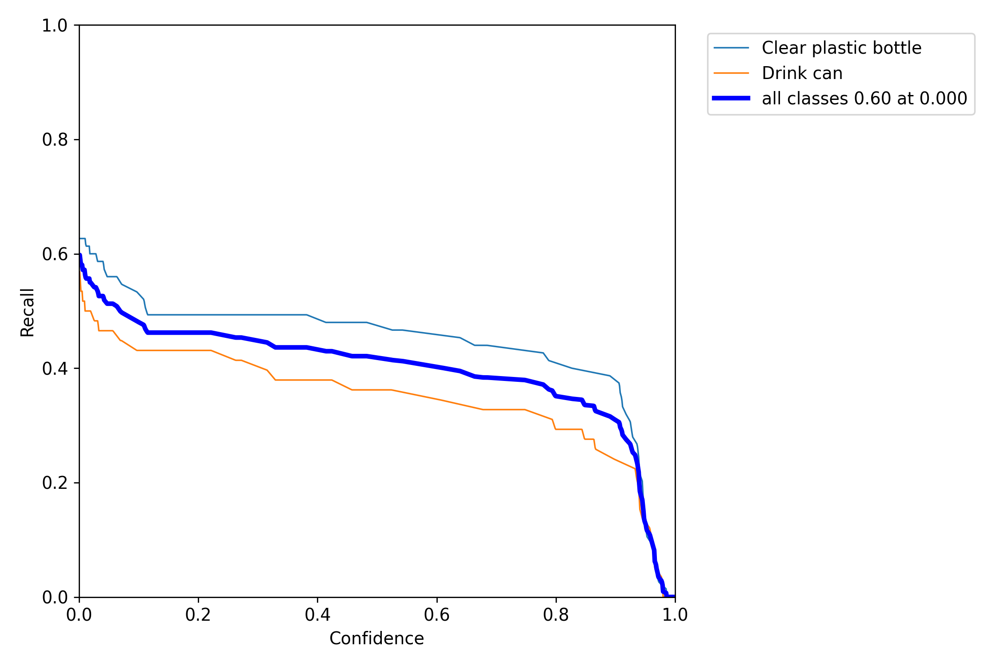

In [34]:
display(Image(filename='runs/train/exp/R_curve.png', width=640))

Precision-Recall curve

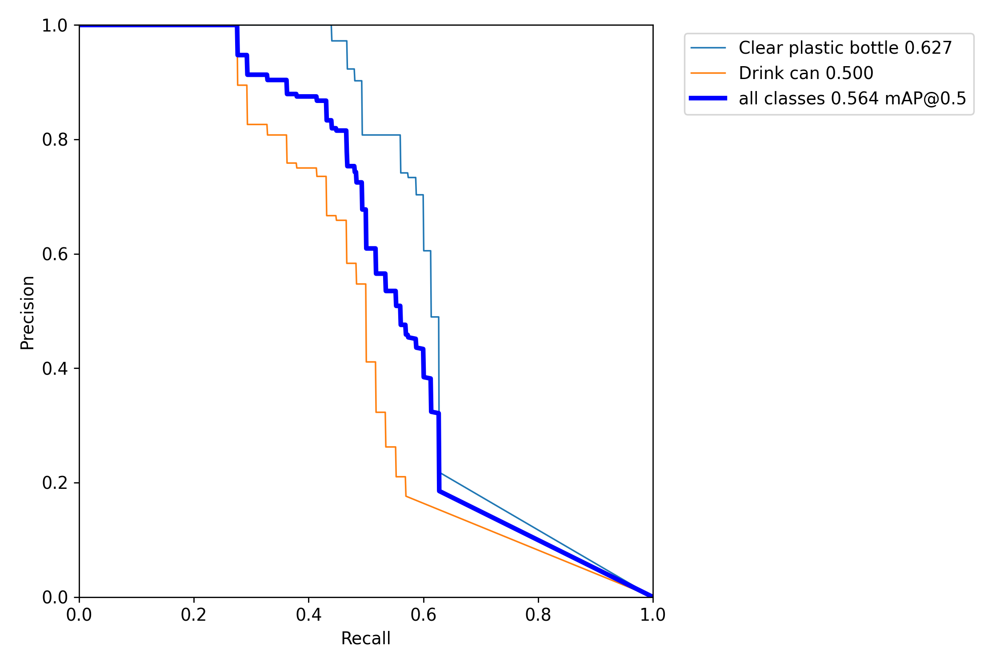

In [35]:
display(Image(filename='runs/train/exp/PR_curve.png', width=640))

F1-score

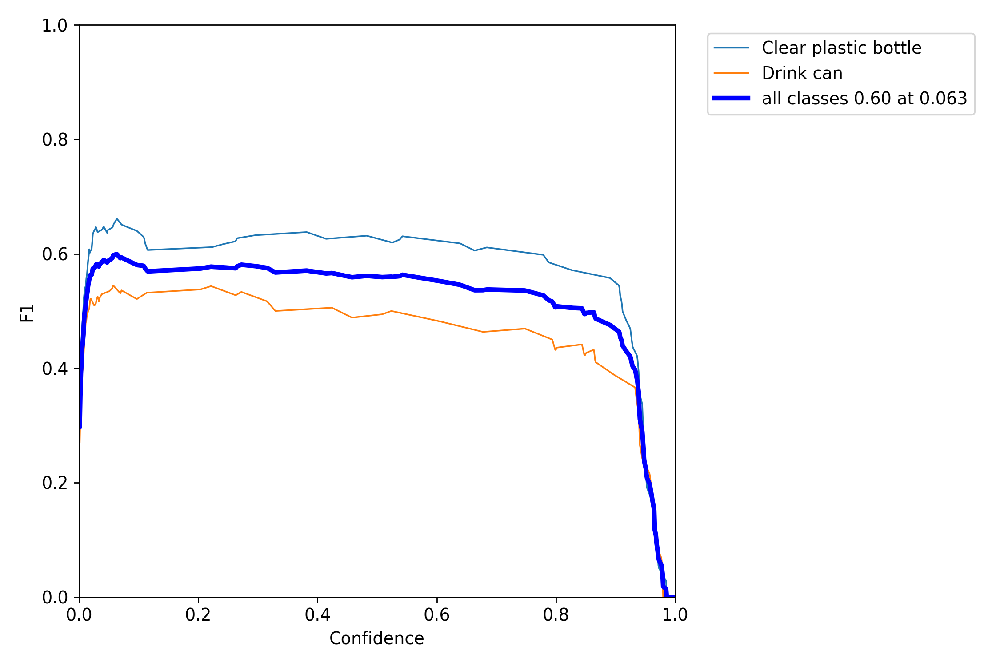

In [36]:
display(Image(filename='runs/train/exp/F1_curve.png', width=640))

Labels

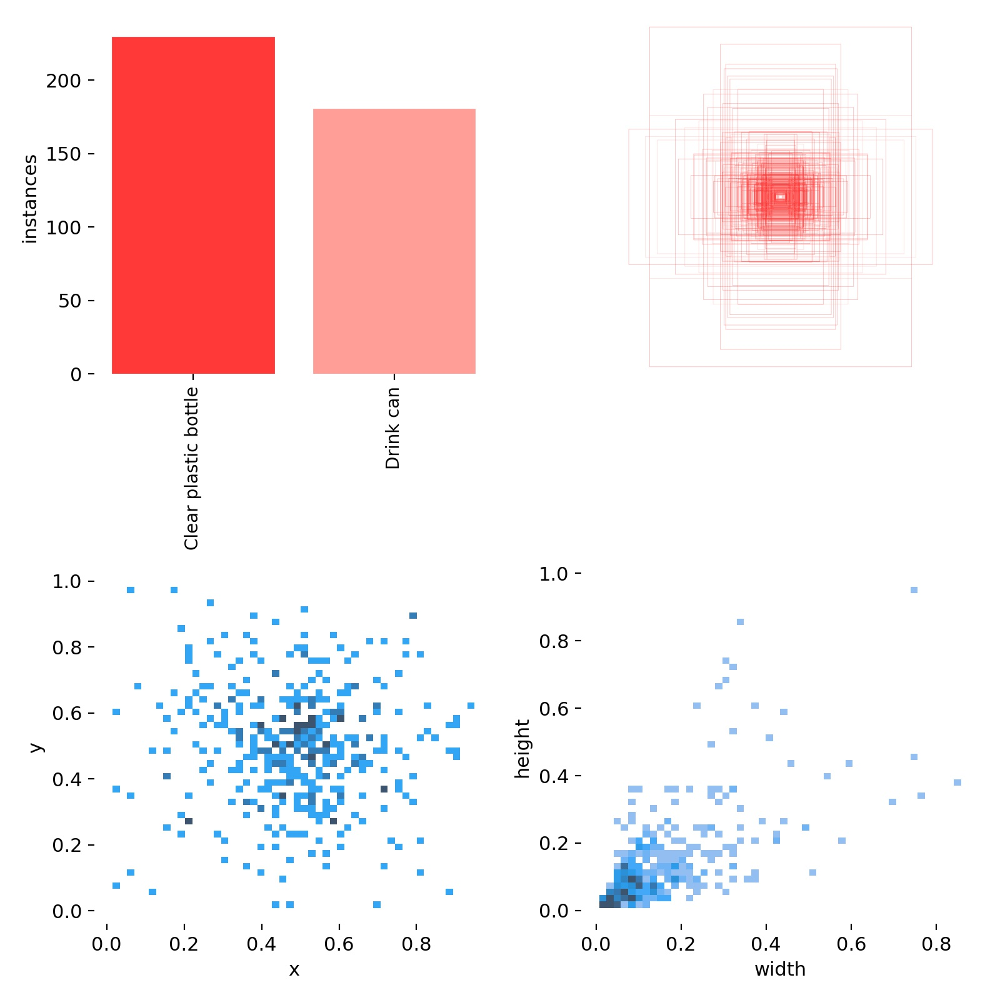

In [4]:
display(Image(filename='runs/train/exp/labels.jpg', width=640))

#### Вывод по результатам обучения модели:
* обучение на NVIDIA A100 (80Gb) заняло 1.5 часа
* на валидационной выборке изображений получены следующие значения метрик оценки качества по 2 классам:
    * Precision: 0.73
    * Recall: 0.508
    * mAP 0.5: 0.564

<a id="test"></a>
## Оценка модели на тестовой выборке

In [19]:
!python val.py --data ../taco2_test.yaml --weights ./runs/train/exp/weights/best.pt --img {IMG_SIZE}

val: data=../taco2_test.yaml, weights=['./runs/train/exp/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.0-253-ga45e472 torch 1.10.1 CUDA:0 (A100-SXM-80GB, 81251MiB)

Fusing layers... 
Model Summary: 213 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning '/home/sergzemsk/dls/yolov5/taco/test/labels' images and labels...
val: New cache created: /home/sergzemsk/dls/yolov5/taco/test/labels.cache
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all         36         51      0.587      0.428      0.463      0.344
Clear plastic bottle         36         28      0.702      0.422      0.497      0.367
           Drink can         36         23      0.472      0.435      0.429   

#### Просмотр детектирования мусора на тестовой выборке изображений

In [21]:
!python detect.py --weights runs/train/exp/weights/best.pt --img {IMG_SIZE} --conf 0.2 --source taco/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=taco/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-253-ga45e472 torch 1.10.1 CUDA:0 (A100-SXM-80GB, 81251MiB)

Fusing layers... 
Model Summary: 213 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/36 /home/sergzemsk/dls/yolov5/taco/test/images/batch_10_000035.jpg: 640x320 Done. (0.013s)
image 2/36 /home/sergzemsk/dls/yolov5/taco/test/images/batch_10_000075.jpg: 640x320 Done. (0.010s)
image 3/36 /home/sergzemsk/dls/yolov5/taco/test/images/batch_11_000048.jpg: 640x480 1 Clear plastic bottle, Done. (0.014s)
image 4/36 /home/sergzemsk/dls/yolov5/taco/test/images/bat

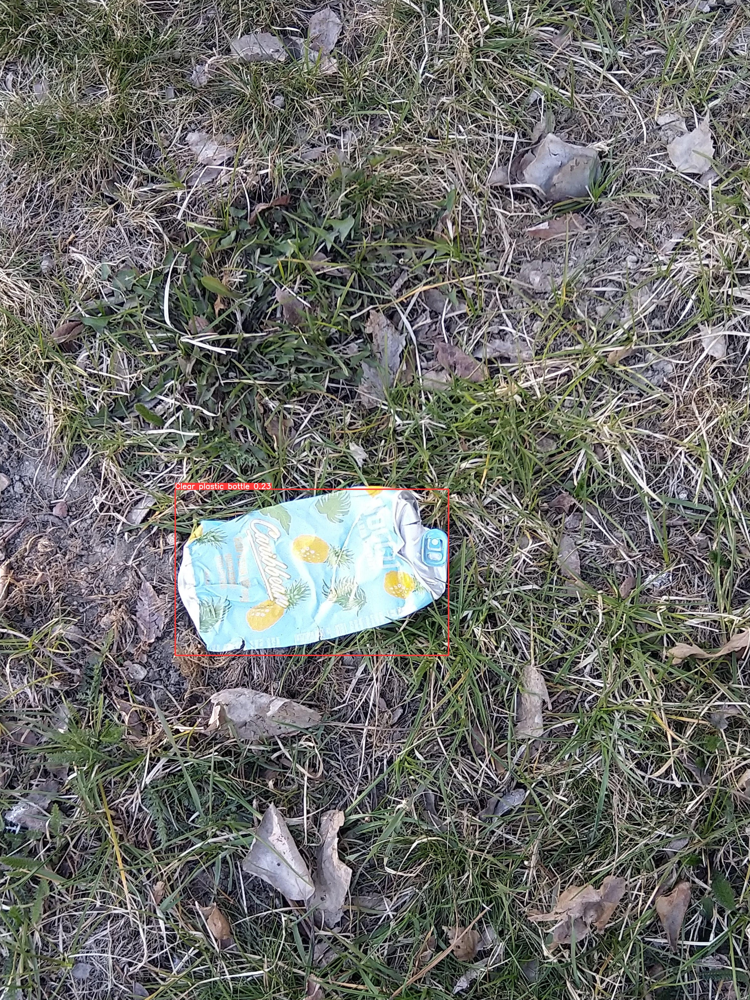

In [5]:
display(Image('runs/detect/exp/batch_11_000048.jpg', width=480))

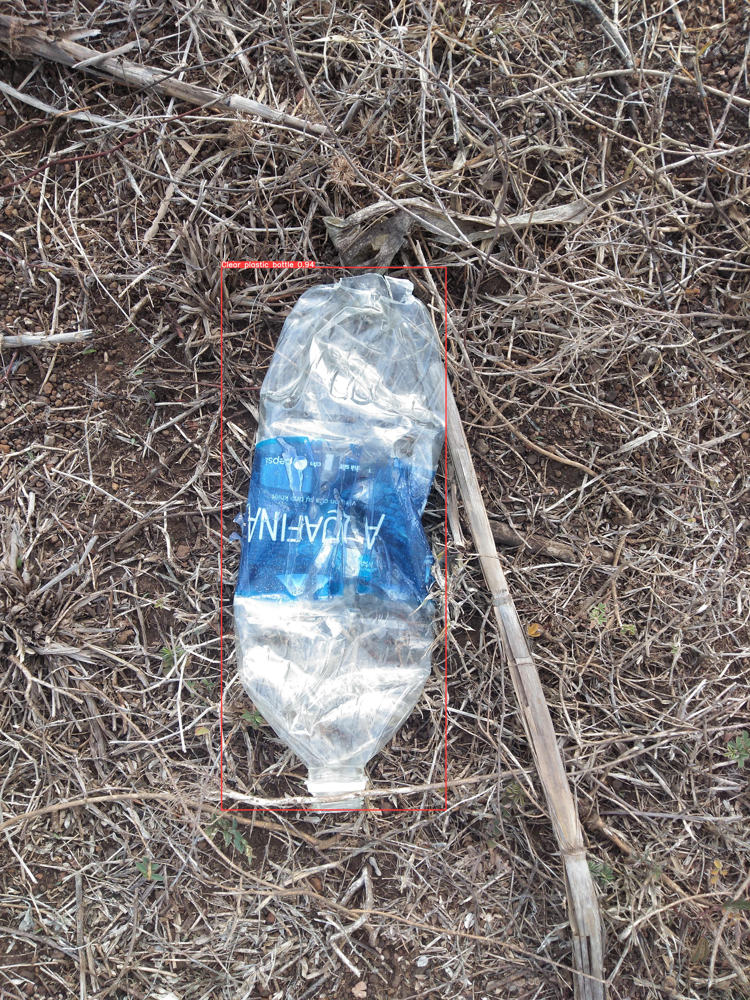

In [6]:
display(Image('runs/detect/exp/batch_13_000042.jpg', width=480))

In [ ]:
# for imageName in glob.glob('runs/detect/exp/*.JPG'):
#     print(f"{imageName}:")
#     display(Image(filename=imageName, width=320))
#     print("\n")

<a id="conclusion"></a>
## Вывод

* обучена модель YOLOv5 (yolov5s) на датасете с фотографиями мусора
* получение метрики оценки качества модели позволяют использовать модель на произвольных фотографиях